# Integrate All ten datasets in one Visualization (~500k cells)

### Import modules, set paths, load files:

In [1]:
# !pip install scanpy
# !pip install ipywidgets
import scanpy as sc
import anndata
import numpy as np
import pandas as pd
import os

from tqdm import tqdm

In [2]:
# !pip install scarches
# !pip install -U pandas==2.0

import scarches as sca

 captum (see https://github.com/pytorch/captum).


In [3]:
# https://github.com/huggingface/transformers/issues/29763
# pip install transformers==4.37.2
import torch

In [4]:
import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action="ignore", category=UserWarning)

## Try out the GTEx datasets

1. Offical website and download dataset:

https://gtexportal.org/home/downloads/adult-gtex/single_cell

https://github.com/hubmapconsortium/hra-workflows-runner/blob/main/src/gtex/downloader.js#L13

In [5]:
path_input_data = '/home/fanhuan/data/BioInfo/453k/GTEx_8_tissues_snRNAseq_atlas_071421.public_obs.h5ad'
reference_adata = sc.read(path_input_data)

In [7]:
adata_concat = reference_adata
adata_concat

AnnData object with n_obs × n_vars = 209126 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'Strand', 'gene_name', 'gene_source', 'gene_biotype', 'gene_length', 'gene_coding_length', 'Approved symbol', '

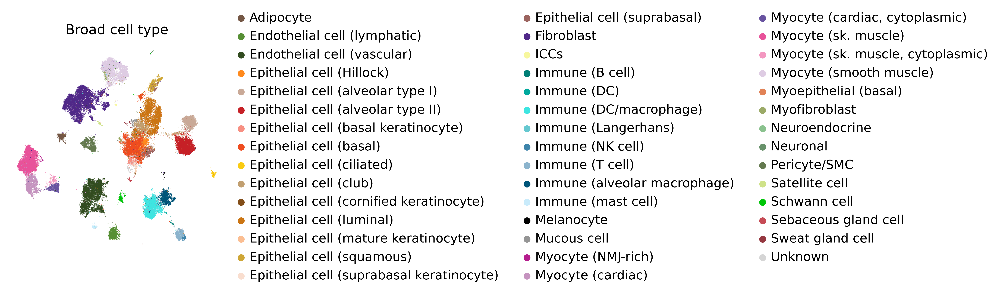

In [10]:
sc.pl.umap(adata_concat, color=['Broad cell type'], wspace=0.5, frameon=False)

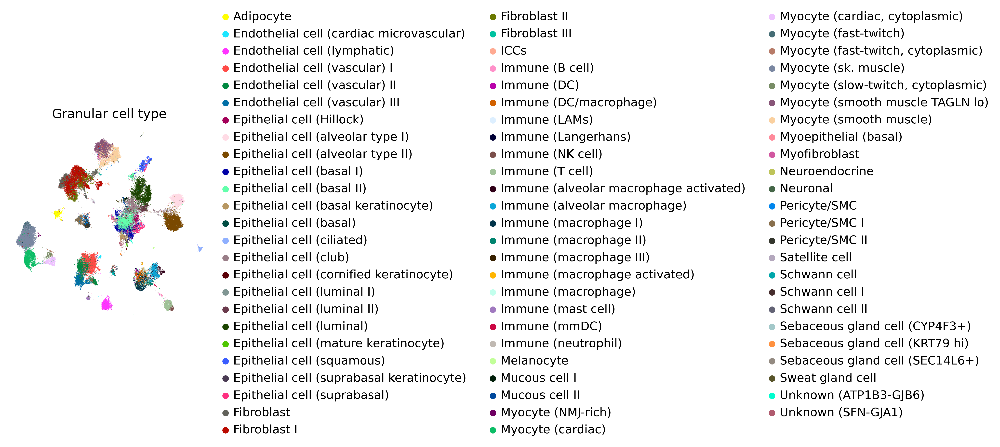

In [13]:
sc.pl.umap(adata_concat, color=['Granular cell type'], wspace=0.5, frameon=False)

# Scanpy UMAP default settings (PCA + UMAP)

In [24]:
del adata_concat.obsm['X_umap']
sc.pp.neighbors(adata_concat)
sc.tl.umap(adata_concat)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


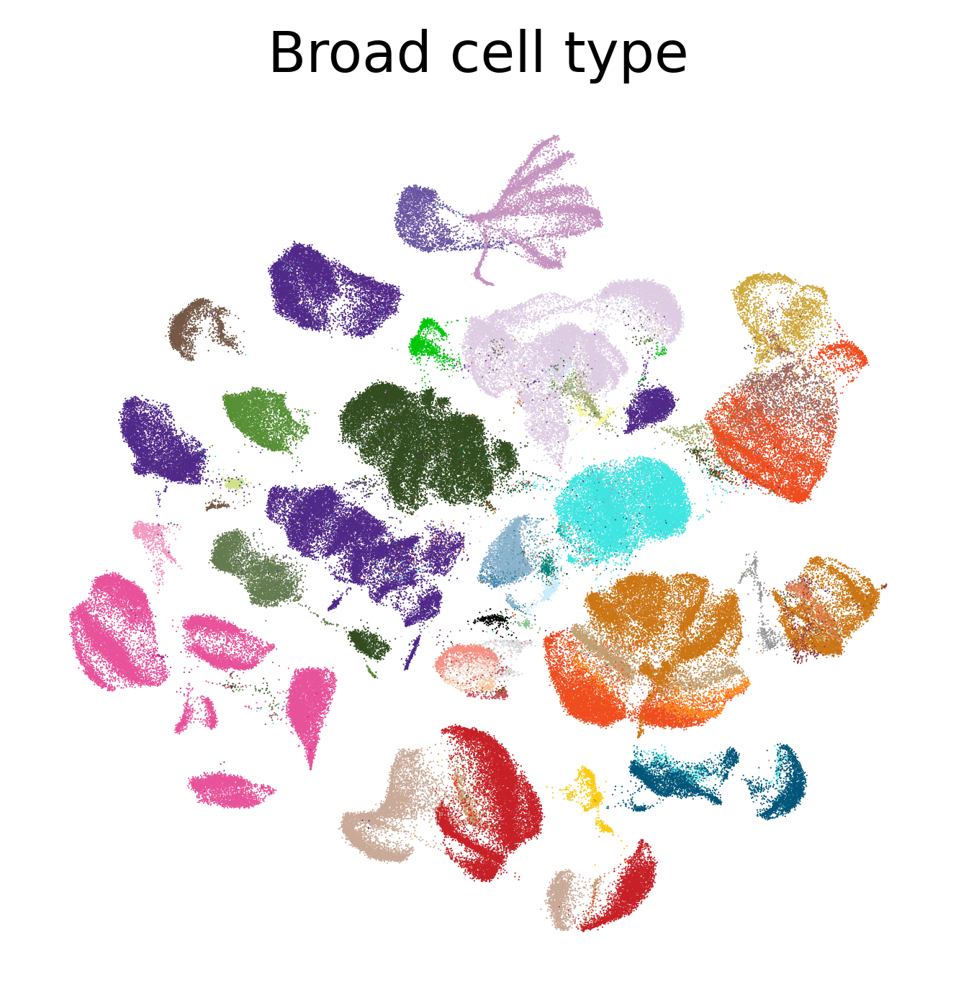

In [25]:
sc.pl.umap(adata_concat, color=['Broad cell type'], frameon=False, legend_loc='best')

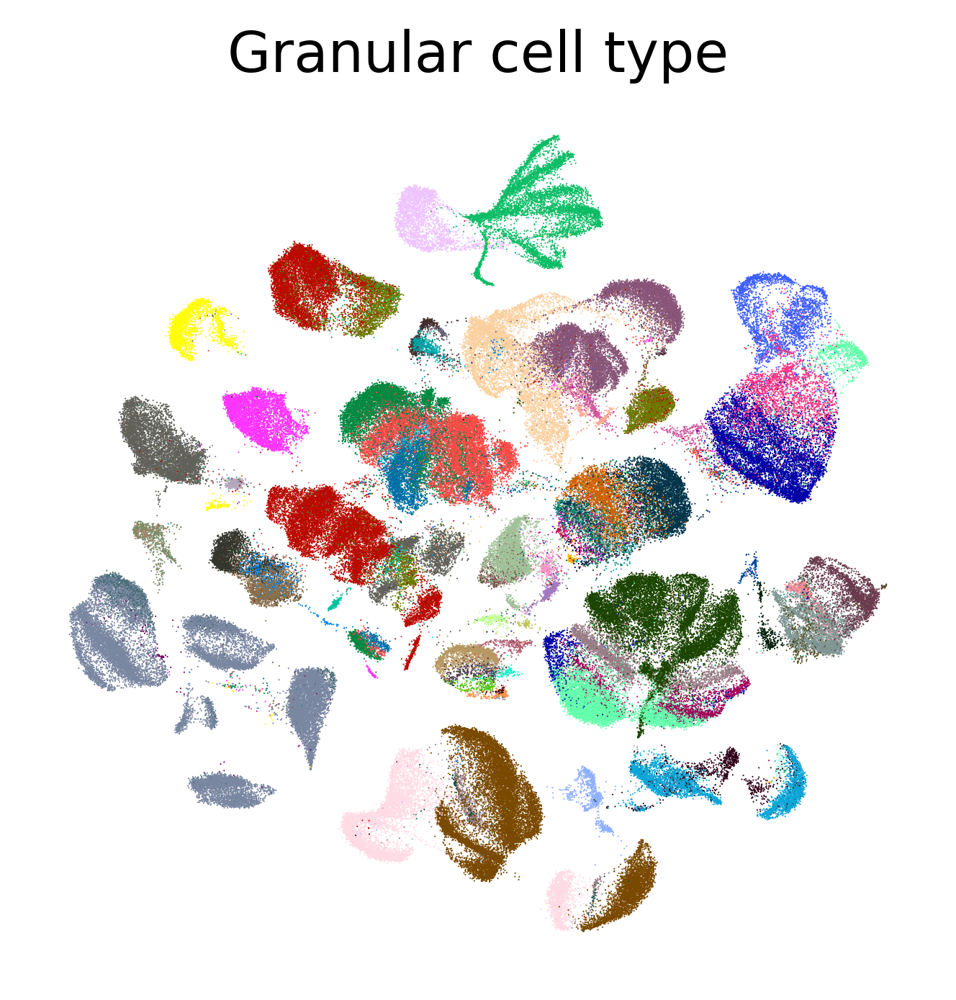

In [26]:
sc.pl.umap(adata_concat, color=['Granular cell type'], frameon=False, legend_loc='best')

# GTEx replication phase 1: preprocess 2 steps
Pre-process steps must be adopted in the GTEx datasets

In [5]:
path_input_data = '/home/fanhuan/data/BioInfo/453k/train-with_annotation-processed-cell_type_high.h5ad'
reference_adata = sc.read(path_input_data)

adata_concat = reference_adata

del adata_concat.obsm['X_umap']
adata_concat

AnnData object with n_obs × n_vars = 259531 × 53221
    obs: 'cell_type', 'cell_type_high', 'cell_type_detail', 'file_label', 'batch', 'n_genes', 'conditions_combined'
    var: 'hugo_symbol', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'cell_type_colors', 'cell_type_detail_colors', 'cell_type_high_colors', 'hvg', 'log1p', 'neighbors', 'umap'
    obsm: 'X_pca'
    layers: 'spliced', 'spliced_unspliced_sum', 'unspliced'
    obsp: 'connectivities', 'distances'

In [ ]:
sc.pp.filter_cells(adata_concat, min_genes=100)
# adata_concat

# sc.pp.highly_variable_genes(adata_concat, n_top_genes=1000, batch_key='orig.ident')
sc.pp.highly_variable_genes(adata_concat, n_top_genes=1000, batch_key='batch')
sc.pp.pca(adata_concat)

adata_concat._sanitize()

from harmony import harmonize
adata_concat.obsm['X_harmony'] = harmonize(adata_concat.obsm['X_pca'], adata_concat.obs, 'batch')

sc.pp.neighbors(adata_concat, use_rep='X_harmony')
sc.tl.umap(adata_concat)

import seaborn as sns
import colorcet as cc

pal = sns.color_palette(cc.glasbey_hv)
pal = pal.as_hex()

adata_concat.uns['labels_colors'] = pal
adata_concat.uns['broad_labels_colors'] = pal
adata_concat.uns['batch_colors'] = pal

adata_concat._sanitize()

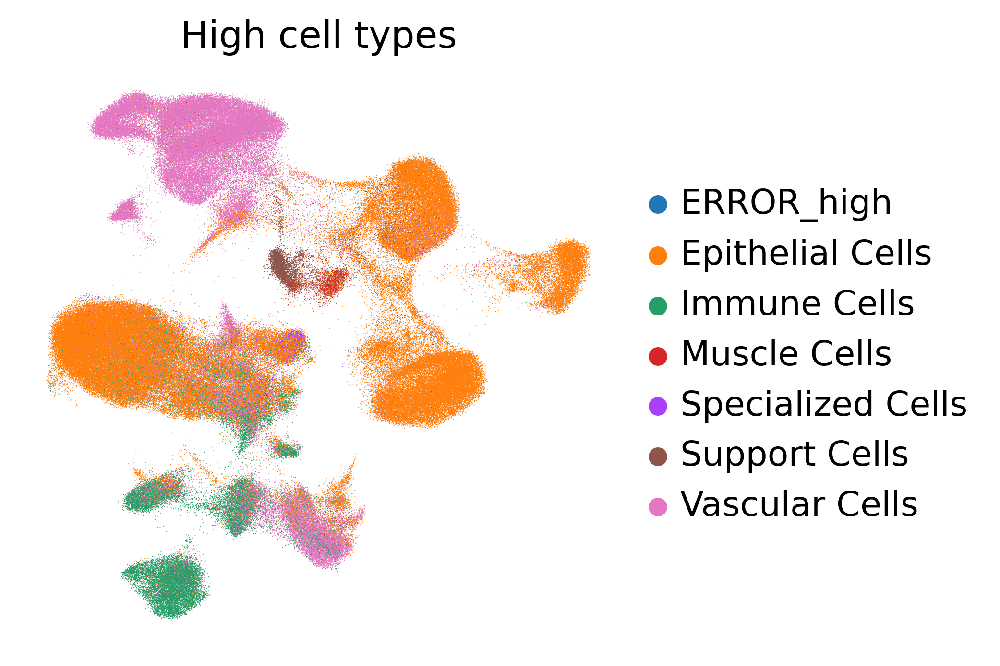

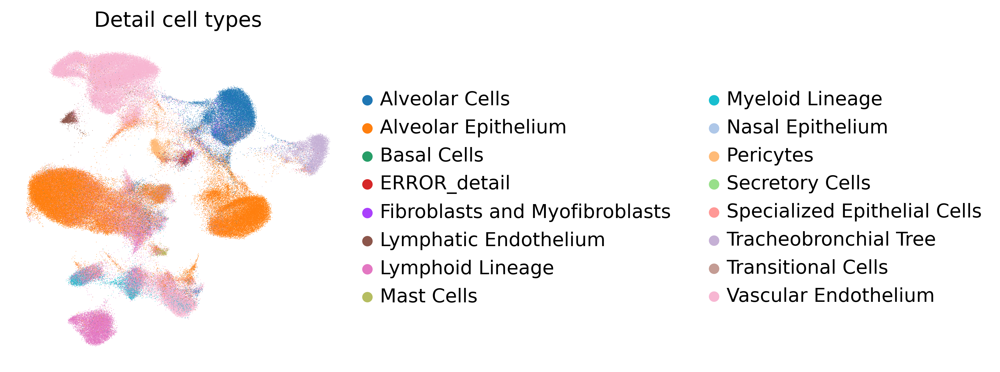

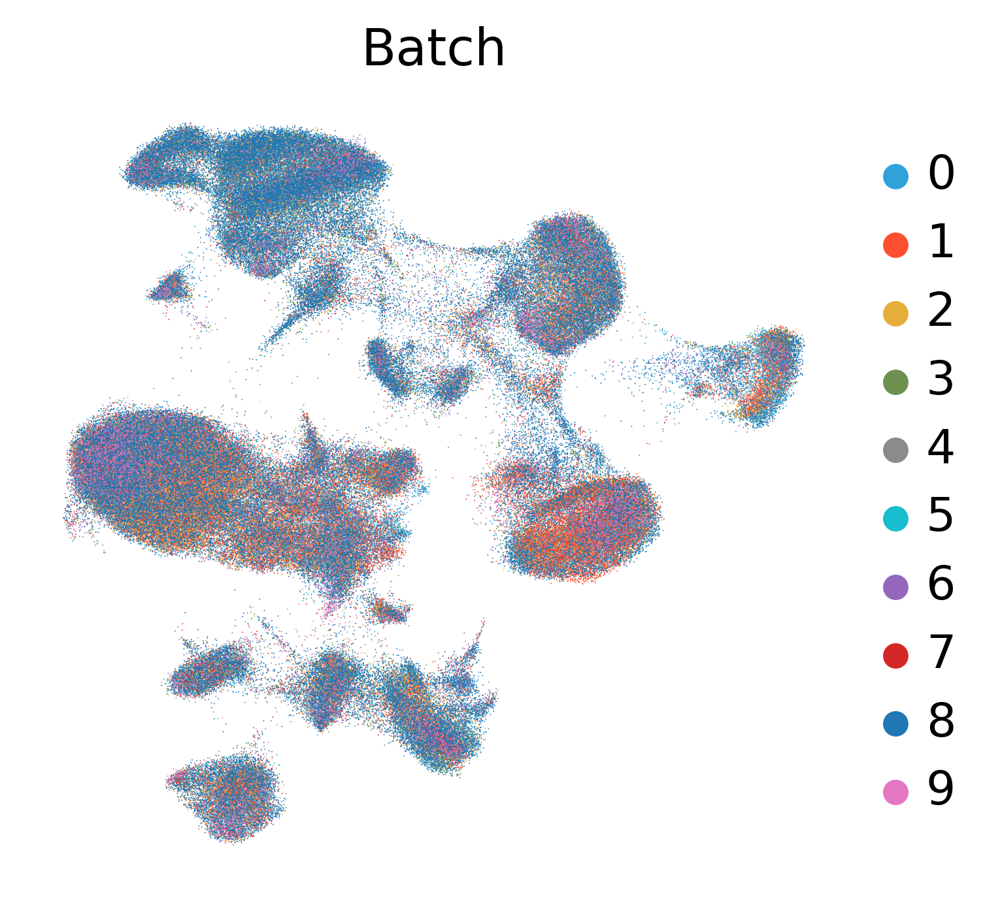

In [11]:
sc.pl.umap(adata_concat, color=['cell_type_high'], frameon=False, title=['High cell types'])
sc.pl.umap(adata_concat, color=['cell_type_detail'], frameon=False, title=['Detail cell types'])
sc.pl.umap(adata_concat, color=['batch'], frameon=False, title=['Batch'])